# Implementação de MLP do Zero

Neste projeto, implementaremos um modelo de Perceptron Multicamadas (MLP) do início ao fim, com o objetivo de realizar a classificação binária do dataset "moons" do Sklearn. A principal proposta é entender detalhadamente o funcionamento de cada etapa de uma rede neural profunda. Embora possamos ter uma noção geral de como esses modelos operam, muitas vezes desconhecemos os detalhes técnicos que ocorrem nos bastidores. Utilizando apenas Numpy e conceitos matemáticos, buscamos compreender cada passo do processo e suas nuances, proporcionando uma visão clara e profunda do funcionamento do modelo.

# Um rápido resumo do que são MLP

Durante 20 anos, as Redes Neurais não foram eficazes para classificar modelos não linearmente separáveis, limitadas pela camada única de perceptron. Com a introdução das MLP (Perceptrons Multicamadas) e DNN (Redes Neurais Profundas), foi possível criar camadas ocultas com funções de ativação não lineares, permitindo a modelagem de problemas mais complexos.

Para otimizar essas redes, surgiu o Backpropagation, que ajusta automaticamente os pesos utilizando gradiente descendente. Esse algoritmo atualiza os pesos da última camada para minimizar a função de custo e, ao propagar o erro para as camadas anteriores, ajusta as conexões, permitindo que a rede aprenda representações não lineares dos dados.

In [59]:
import numpy as np

from IPython.display import HTML

from sklearn.datasets import make_moons
from sklearn.model_selection import train_test_split

import matplotlib.animation as animation
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import cm
sns.set_style("whitegrid")

# Modelo

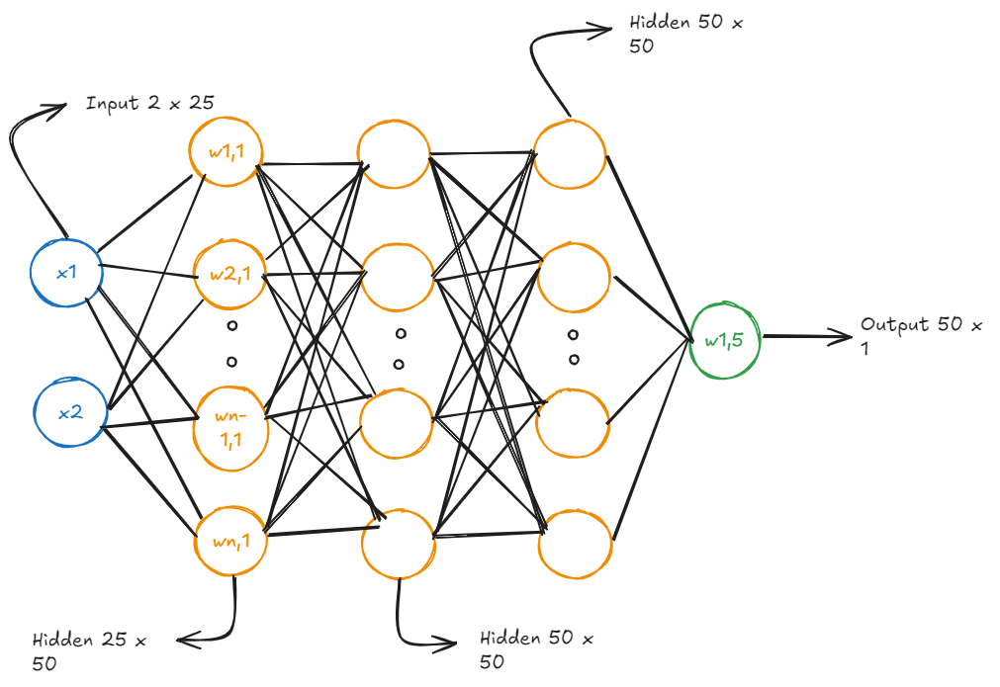

# Informações do Projeto

Neste projeto, implementaremos uma rede neural utilizando a técnica de inicialização Xavier. A arquitetura será composta por uma camada de entrada com dimensões 2×25, três camadas ocultas de tamanhos 25 × 50 e 50 × 50, e uma camada de saída com dimensões 50 × 1

A função de perda escolhida será a entropia cruzada (cross-entropy), com funções de ativação ReLU nas camadas iniciais e intermediárias, enquanto a camada de saída utilizará a função sigmoide.

O ajuste dos pesos será feito através do otimizador ADAM, assegurando uma atualização eficiente dos parâmetros do modelo.

# Etapas do Projeto:

1. Implementação do inicializador
2. Desenvolvimento das funções de ativação e suas derivadas
3. Construção da função de forward pass
4. Implementação da função de backpropagation
5. Desenvolvimento da função de atualização dos pesos
6. Construção da função de treinamento do modelo

In [60]:
#faremos o trabalho com uma amostra de 1000 exemplos e um test size de 20%
N_SAMPLES = 1000
TEST_SIZE = 0.2

# Sobre os dados

A função make_moons do Scikit-Learn gera um conjunto de dados sintético bidimensional, frequentemente utilizado para testes e experimentação de algoritmos de aprendizado de máquina. Ela cria dois semicírculos interligados, formando um padrão semelhante a luas crescentes. Esse dataset é útil para avaliar modelos de classificação não linear, pois os dados não são separáveis linearmente.

Além disso, make_moons permite a adição de ruído aos dados por meio do parâmetro noise, tornando o problema mais desafiador e realista para modelos como redes neurais 

In [61]:
X, y = make_moons(n_samples = N_SAMPLES, noise=0.2, random_state=100)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=TEST_SIZE, random_state=42)

In [62]:
# the function making up the graph of a dataset
def make_plot(X, y, plot_name, file_name=None, XX=None, YY=None, preds=None, dark=False):
    if (dark):
        plt.style.use('dark_background')
    else:
        sns.set_style("whitegrid")
    plt.figure(figsize=(16,8))
    axes = plt.gca()
    axes.set(xlabel="$X_1$", ylabel="$X_2$")
    plt.title(plot_name, fontsize=30)
    plt.subplots_adjust(left=0.20)
    plt.subplots_adjust(right=0.80)
    if(XX is not None and YY is not None and preds is not None):
        plt.contourf(XX, YY, preds.reshape(XX.shape), 25, alpha = 1, cmap=cm.Spectral)
        plt.contour(XX, YY, preds.reshape(XX.shape), levels=[.5], cmap="Greys", vmin=0, vmax=.6)
    plt.scatter(X[:, 0], X[:, 1], c=y.ravel(), s=40, cmap=plt.cm.Spectral, edgecolors='black')
    if(file_name):
        plt.savefig(file_name)
        plt.close()

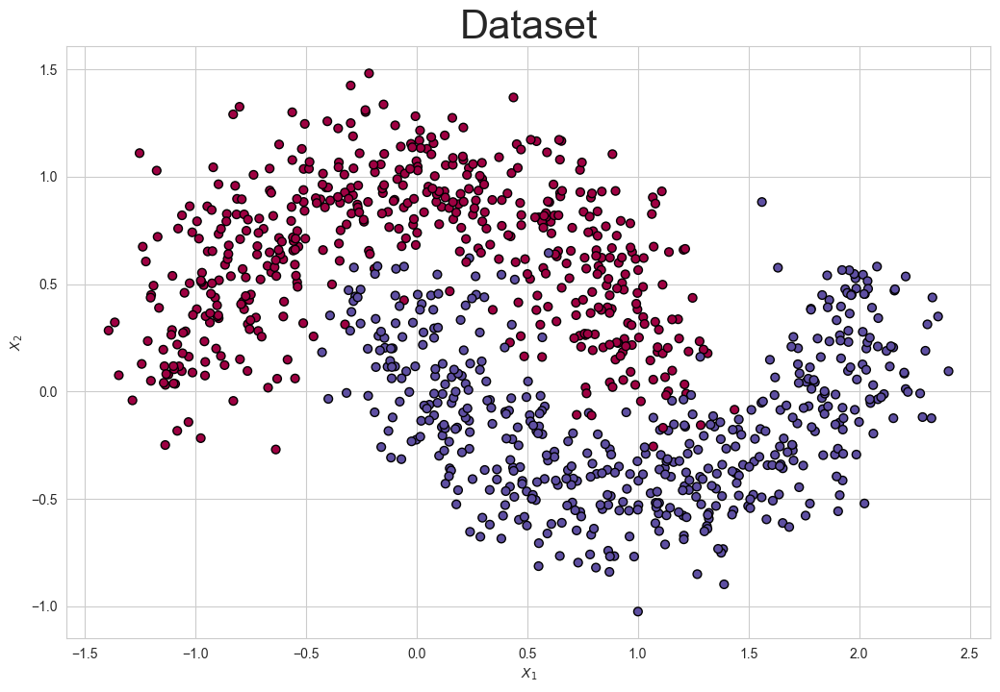

In [63]:
make_plot(X, y, 'Dataset')

Precisamos transpor nossos dados X para que cada coluna (feature) isso é esperado das redes neurais

In [64]:
X_train = X_train.T
X_train.shape

(2, 800)

In [65]:
y_train.shape

(800,)

# Inicialização de Xavier Normal

$$W ~ N (0, \frac{2}{n_{in} + n_{out}})$$

Onde:

- $W$ = pesos da camada
- $n_{in}$ = número de neurônios na camada de entrada
- $n_{out}$ = número de neurônios na camada de saída
- $N(\mu, \sigma^2)$ := $N(0, ...)$ = representa uma distribuição normal de média $\mu$ e variância $\sigma^2$ 

A inicialização Xavier (também chamada de Glorot Initialization) é uma técnica que define valores iniciais para os pesos da rede neural de maneira a manter a variância dos sinais ao longo das camadas, evitando gradientes muito grandes ou muito pequenos.

Começar com pesos iniciais errados pode ser custoso, normalmente quando se inicia com pesos extremamente próximos de 0, e sendo a função de [ativação] uma sigmoid, pode levar a não convergência do modelo, isso leva à coeficientes tão pequenos que nunca serão atualizados, chamamos isso de *Vanishing Gradient*

É comum se iniciar com valores aleatórios e próximos de zero

E também, começar com valores muito próximos de zero causam pesos que nunca se mexem e começar com pesos muito altos pode trazer soluções ruins

In [66]:
def init_params():
    W1 = np.random.randn(25, 2) * np.sqrt(2. / (2 + 25))  # Inicialização Xavier
    b1 = np.zeros((25, 1))   # Biases inicializados com 0

    W2 = np.random.randn(50, 25) * np.sqrt(2. / (25 + 50)) # Xavier para camada 2
    b2 = np.zeros((50, 1))   # Biases inicializados com 0

    W3 = np.random.randn(50, 50) * np.sqrt(2. / (50 + 50)) # Xavier para camada 3
    b3 = np.zeros((50, 1))   # Biases inicializados com 0

    W4 = np.random.randn(50, 50) * np.sqrt(2. / (50 + 50)) # Xavier para camada 4
    b4 = np.zeros((50, 1))   # Biases inicializados com 0

    W5 = np.random.randn(1, 50) * np.sqrt(2. / (50 + 1))   # Xavier para camada de saída
    b5 = np.zeros((1, 1))    # Biases inicializados com 0


    # Inicializar m e v como zeros (são pesos importante para nosso otimizador mais à frente)
    m_W1 = np.zeros_like(W1)
    m_b1 = np.zeros_like(b1)
    m_W2 = np.zeros_like(W2)
    m_b2 = np.zeros_like(b2)
    m_W3 = np.zeros_like(W3)
    m_b3 = np.zeros_like(b3)
    m_W4 = np.zeros_like(W4)
    m_b4 = np.zeros_like(b4)
    m_W5 = np.zeros_like(W5)
    m_b5 = np.zeros_like(b5)
    
    v_W1 = np.zeros_like(W1)
    v_b1 = np.zeros_like(b1)
    v_W2 = np.zeros_like(W2)
    v_b2 = np.zeros_like(b2)
    v_W3 = np.zeros_like(W3)
    v_b3 = np.zeros_like(b3)
    v_W4 = np.zeros_like(W4)
    v_b4 = np.zeros_like(b4)
    v_W5 = np.zeros_like(W5)
    v_b5 = np.zeros_like(b5)

    return W1, b1, W2, b2, W3, b3, W4, b4, W5, b5, m_W1, m_b1, m_W2, m_b2, m_W3, m_b3, m_W4, m_b4, m_W5, m_b5, v_W1, v_b1, v_W2, v_b2, v_W3, v_b3, v_W4, v_b4, v_W5, v_b5


Funções de ativação 

- **ReLU**: Ele determina 1 para valores positivos e 0 para negativos $$f(z) = max(0, z)$$


- **Sigmoide**: Ela é mais útil pois também mostra uma certa incerteza do modelo. Por exemplo, não retornaria só {0,1} mas {0.5} por exemplo $$f(z) = \frac{1}{1+e^{-z}} $$

- **Derivada ReLU**: $$\text{ReLU}_a (z) = \begin{cases} 1 \text{ se } z > 0 \\ 0 \text{ se } z <= 0\end{cases}$$

In [67]:
def ReLU(Z):
    return np.maximum(Z, 0)


def sigmoid(Z):
    return 1/(1+np.exp(-Z))


def ReLU_deriv(Z):
    return Z > 0 


# Forward Propagation

A foward propagation é a parte mais simples de uma rede neural, é onde cada neurônio aplica uma função linear onde $z = w_{1,1}*x1 + w_{1,2}*x2 + b1$ e depois tranformamos $z$ com a função de ativação no caso $ReLU(z)$

Isso é feito para cada neurônio em relação aos dois inputs do modelo, portanto são multiplicadas duas matrizes, uma matriz de pesos por um matriz de inputs (ou ativações de camadas anteriores)

Exemplo da camada de entrada à camada 2:

1. $Z^\text{[1]} = W^\text{[1]} . X + b1$ -> $A^\text{[1]} = ReLU(Z^\text{[1]})$

2. $Z^\text{[2]} = W^\text{[2]} . A^\text{[1]} + b2$ -> $A^\text{[2]} = ReLU(Z^\text{[2]})$

3. $Z^\text{[3]} = W^\text{[3]} . A^\text{[2]} + b3$ -> $A^\text{[3]} = ReLU(Z^\text{[3]})$

4. $Z^\text{[4]} = W^\text{[4]} . A^\text{[3]} + b4$ -> $A^\text{[4]} = ReLU(Z^\text{[4]})$

5. $Z^\text{[5]} = W^\text{[5]} . A^\text{[4]} + b5$ -> $A^\text{[5]} = ReLU(Z^\text{[5]})$



In [68]:
def forward_prop(W1, b1, W2, b2, W3, b3, W4, b4, W5, b5, X):
    Z1 = W1.dot(X) + b1
    A1 = ReLU(Z1)

    Z2 = W2.dot(A1) + b2
    A2 = ReLU(Z2)

    Z3 = W3.dot(A2) + b3
    A3 = ReLU(Z3)

    Z4 = W4.dot(A3) + b4
    A4 = ReLU(Z4)

    Z5 = W5.dot(A4) + b5
    A5 = sigmoid(Z5)

    return Z1, A1, Z2, A2, Z3, A3, Z4, A4, Z5, A5

# Backward Propagation

Backward propagation começa por um primeiro passo importante: calculamos a derivada da loss function escolhida pela derivada da função de ativação (no nosso caso **sigmoid**). Essa passo serve para calcular a derivada da primeira camada cujos erros servirão de retroativo para camadas anteriores

Como função de custo escolhemos a Cross Loss Entropy (útil para situações binárias)

$$ L = - \frac{1}{m} \Sigma[y^\text{i}.log(A^\text{5}) + (1 - y^\text{i}) . log(1 - A^\text{[5]})] $$
$$\frac{\partial L}{\partial A^\text{[5]}} = \frac{-y}{A^\text{[5]}} + \frac{(1 - y)}{(1 - A^\text{[5]})}$$
$$Derivada Sigmoid = \frac{d\sigma}{dZ} = A^\text{[5]}.(1 - A^\text{[5]})$$
$$\frac{\partial L}{\partial Z^\text{[5]}} = (\frac{\partial L}{\partial A^\text{[5]}}) . (\frac{\partial A^\text{[5]}}{\partial Z^\text{[5]}})$$

Resumindo 

$$\frac{\partial L}{\partial Z^\text{[5]}} = A^\text{[5]} - Y$$


## Após o cálculo do gradiente de erro começamos a propagação

### Passo 1
$$dZ\text{[5]} = A^\text{[5]} - Y$$

$$dW^\text{[5]} = \frac{1}{m} * dZ^\text{[5]} . A^\text{[4]}.T$$

$$db^\text{[5]} = \frac{1}{m} * \Sigma(dZ^\text{[5]})$$
---
### Passo 2

$$dZ\text{[4]} = W^\text{[4]}.T . dZ^\text{[5]} * \text{g'}(Z^\text{[4]})$$

$$dW^\text{[4]} = \frac{1}{m} * dZ^\text{[5]} . A^\text{[3]}.T$$

$$db^\text{[4]} = \frac{1}{m} * \Sigma(dZ^\text{[4]})$$
---
### Passo 3
$$dZ\text{[3]} = W^\text{[3]}.T . dZ^\text{[4]} * \text{g'}(Z^\text{[3]})$$

$$dW^\text{[3]} = \frac{1}{m} * dZ^\text{[3]} . A^\text{[2]}.T$$

$$db^\text{[3]} = \frac{1}{m} * \Sigma(dZ^\text{[3]})$$
---
### Passo 4
$$dZ\text{[2]} = W^\text{[2]}.T . dZ^\text{[3]} * \text{g'}(Z^\text{[2]})$$

$$dW^\text{[2]} = \frac{1}{m} * dZ^\text{[2]} . A^\text{[1]}.T$$

$$db^\text{[2]} = \frac{1}{m} * \Sigma(dZ^\text{[2]})$$
---
### Passo 5
$$dZ\text{[1]} = W^\text{[1]}.T . dZ^\text{[2]} * \text{g'}(Z^\text{[1]})$$

$$dW^\text{[1]} = \frac{1}{m} * dZ^\text{[2]} . X.T$$

$$db^\text{[1]} = \frac{1}{m} * \Sigma(dZ^\text{[1]})$$






In [69]:

def backward_prop(Z1, A1, Z2, A2, Z3, A3, Z4, A4, Z5, A5, W1, W2, W3, W4, W5, X, Y):

    m = X_train.shape[1]


    dZ5 = A5 - Y
    dW5 = 1 / m * dZ5.dot(A4.T)
    db5 = 1 / m * np.sum(dZ5)

    dZ4 = W5.T.dot(dZ5) * ReLU_deriv(Z4)
    dW4 = 1 / m * dZ4.dot(A3.T)
    db4 = 1 / m * np.sum(dZ4)

    dZ3 = W4.T.dot(dZ4) * ReLU_deriv(Z3)
    dW3 = 1 / m * dZ3.dot(A2.T)
    db3 = 1 / m * np.sum(dZ3)

    dZ2 = W3.T.dot(dZ3) * ReLU_deriv(Z2)
    dW2 = 1 / m * dZ2.dot(A1.T)
    db2 = 1 / m * np.sum(dZ2)


    dZ1 = W2.T.dot(dZ2) * ReLU_deriv(Z1)
    dW1 = 1 / m * dZ1.dot(X.T)
    db1 = 1 / m * np.sum(dZ1)



    return dW1, db1, dW2, db2, dW3, db3, dW4, db4, dW5, db5

# Otimizador Adam

Um dos melhores otimizadores modernos, combina o poder do *momentum* e *RMSProp*

O otimizador Adam (Adaptive Moment Estimation) combina os benefícios dos métodos de Gradiente Estocástico com Momento (Momentum) e Adagrad. Ele ajusta as taxas de aprendizado de forma adaptativa, levando em conta as primeiras e segundas ordens dos momentos (média e variância) dos gradientes. Isso resulta em uma convergência mais rápida e eficiente, especialmente em problemas com grandes volumes de dados e parâmetros. Seus principais benefícios incluem melhor desempenho em tarefas complexas e estabilidade durante o treinamento.

### 1. Atualização dos Momentos de Primeiro e Segundo Ordem

Para cada peso e viés $W_i$ e $b_i$ (onde $i$ é 1, 2, 3, 4, 5), os momentos $m$ (média) e $v$ (variância) são atualizados de acordo com a fórmula:


$$m_{W_i} = \beta_1 m_{W_i} + (1 - \beta_1) dW_i$$

$$v_{W_i} = \beta_2 v_{W_i} + (1 - \beta_2) \left( dW_i \right)^2$$



$$m_{b_i} = \beta_1 m_{b_i} + (1 - \beta_1) db_i$$


$$v_{b_i} = \beta_2 v_{b_i} + (1 - \beta_2) \left( db_i \right)^2$$


Onde:
- $dW_i$ é o gradiente de $W_i$,
- $db_i$ é o gradiente de $b_i$,
- $\beta_1$ e $\beta_2$ são os hiperparâmetros do Adam.

---

### 2. Correção de Viés

A correção de viés é aplicada para corrigir os momentos $m$ e $v$ nos primeiros passos de treinamento:


$$\hat{m}_{W_i} = \frac{m_{W_i}}{1 - \beta_1^t}$$


$$\hat{v}_{W_i} = \frac{v_{W_i}}{1 - \beta_2^t}$$



$$\hat{m}_{b_i} = \frac{m_{b_i}}{1 - \beta_1^t}$$


$$\hat{v}_{b_i} = \frac{v_{b_i}}{1 - \beta_2^t}$$


Onde $t$ é o número da iteração.

---

### 3. Atualização dos Parâmetros

Finalmente, os parâmetros $W_i$ e $b_i$ são atualizados usando os momentos corrigidos de viés:


$$W_i = W_i - \frac{\alpha \hat{m}_{W_i}}{\sqrt{\hat{v}_{W_i}} + \epsilon}$$


$$b_i = b_i - \frac{\alpha \hat{m}_{b_i}}{\sqrt{\hat{v}_{b_i}} + \epsilon}$$


Onde:
- $\alpha$ é a taxa de aprendizado,
- $\epsilon$ é um valor pequeno para evitar a divisão por zero.


# Parâmetros de Adam

Normalmente Normalmente $\beta_1$ se inicia com 0.9, enquanto $\beta_2$ é inicializado com 0.999 e $\varepsilon$ sempre em um valor muito baixo como $10^{-8}$ 

In [70]:
def update_params(W1, b1, W2, b2, W3, b3, W4, b4, W5, b5, 
                       dW1, db1, dW2, db2, dW3, db3, dW4, db4, dW5, db5, 
                       alpha, beta1, beta2, epsilon, t, m_W1, m_b1, m_W2, m_b2, m_W3, m_b3, m_W4, m_b4, m_W5, m_b5, v_W1, v_b1, v_W2, v_b2, v_W3, v_b3, v_W4, v_b4, v_W5, v_b5):
    
    # Atualizar momentos (m e v) para cada parâmetro
    m_W1 = beta1 * m_W1 + (1 - beta1) * dW1
    m_b1 = beta1 * m_b1 + (1 - beta1) * db1
    v_W1 = beta2 * v_W1 + (1 - beta2) * np.square(dW1)
    v_b1 = beta2 * v_b1 + (1 - beta2) * np.square(db1)

    m_W2 = beta1 * m_W2 + (1 - beta1) * dW2
    m_b2 = beta1 * m_b2 + (1 - beta1) * db2
    v_W2 = beta2 * v_W2 + (1 - beta2) * np.square(dW2)
    v_b2 = beta2 * v_b2 + (1 - beta2) * np.square(db2)

    m_W3 = beta1 * m_W3 + (1 - beta1) * dW3
    m_b3 = beta1 * m_b3 + (1 - beta1) * db3
    v_W3 = beta2 * v_W3 + (1 - beta2) * np.square(dW3)
    v_b3 = beta2 * v_b3 + (1 - beta2) * np.square(db3)

    m_W4 = beta1 * m_W4 + (1 - beta1) * dW4
    m_b4 = beta1 * m_b4 + (1 - beta1) * db4
    v_W4 = beta2 * v_W4 + (1 - beta2) * np.square(dW4)
    v_b4 = beta2 * v_b4 + (1 - beta2) * np.square(db4)

    m_W5 = beta1 * m_W5 + (1 - beta1) * dW5
    m_b5 = beta1 * m_b5 + (1 - beta1) * db5
    v_W5 = beta2 * v_W5 + (1 - beta2) * np.square(dW5)
    v_b5 = beta2 * v_b5 + (1 - beta2) * np.square(db5)
    
    # Corrigir o viés (bias correction)
    m_W1_hat = m_W1 / (1 - beta1**t)
    m_b1_hat = m_b1 / (1 - beta1**t)
    v_W1_hat = v_W1 / (1 - beta2**t)
    v_b1_hat = v_b1 / (1 - beta2**t)

    m_W2_hat = m_W2 / (1 - beta1**t)
    m_b2_hat = m_b2 / (1 - beta1**t)
    v_W2_hat = v_W2 / (1 - beta2**t)
    v_b2_hat = v_b2 / (1 - beta2**t)

    m_W3_hat = m_W3 / (1 - beta1**t)
    m_b3_hat = m_b3 / (1 - beta1**t)
    v_W3_hat = v_W3 / (1 - beta2**t)
    v_b3_hat = v_b3 / (1 - beta2**t)

    m_W4_hat = m_W4 / (1 - beta1**t)
    m_b4_hat = m_b4 / (1 - beta1**t)
    v_W4_hat = v_W4 / (1 - beta2**t)
    v_b4_hat = v_b4 / (1 - beta2**t)

    m_W5_hat = m_W5 / (1 - beta1**t)
    m_b5_hat = m_b5 / (1 - beta1**t)
    v_W5_hat = v_W5 / (1 - beta2**t)
    v_b5_hat = v_b5 / (1 - beta2**t)

    # Atualizar os parâmetros
    W1 -= alpha * m_W1_hat / (np.sqrt(v_W1_hat) + epsilon)
    b1 -= alpha * m_b1_hat / (np.sqrt(v_b1_hat) + epsilon)
    W2 -= alpha * m_W2_hat / (np.sqrt(v_W2_hat) + epsilon)
    b2 -= alpha * m_b2_hat / (np.sqrt(v_b2_hat) + epsilon)
    W3 -= alpha * m_W3_hat / (np.sqrt(v_W3_hat) + epsilon)
    b3 -= alpha * m_b3_hat / (np.sqrt(v_b3_hat) + epsilon)
    W4 -= alpha * m_W4_hat / (np.sqrt(v_W4_hat) + epsilon)
    b4 -= alpha * m_b4_hat / (np.sqrt(v_b4_hat) + epsilon)
    W5 -= alpha * m_W5_hat / (np.sqrt(v_W5_hat) + epsilon)
    b5 -= alpha * m_b5_hat / (np.sqrt(v_b5_hat) + epsilon)

    return W1, b1, W2, b2, W3, b3, W4, b4, W5, b5, m_W1, m_b1, m_W2, m_b2, m_W3, m_b3, m_W4, m_b4, m_W5, m_b5, v_W1, v_b1, v_W2, v_b2, v_W3, v_b3, v_W4, v_b4, v_W5, v_b5


# Cálculo de Acurácia

O primeiro passo será definir um limiar de decisão para as ativações na camada $A^\text{[5]}$. Para cada valor de ativação, caso seja superior a 0,5, atribuímos o rótulo 1; caso contrário, se for igual ou inferior a 0,5, atribuiremos o rótulo 0.

Em seguida, a acurácia será calculada como a média dos valores classificados corretamente, ou seja, a proporção de previsões em que o rótulo atribuído corresponde ao valor verdadeiro.

In [71]:
def get_predictions(A5):
    return (A5 > 0.5).astype(int) if A5.shape[0] == 1 else np.argmax(A5, axis=0)

def get_accuracy(predictions, Y):
    if Y.ndim > 1:
        Y = np.argmax(Y, axis=0)
    return np.mean(predictions == Y)

# Montagem da Função de Treinamento

Por fim, iremos estruturar a função de treinamento, que será uma combinação das funções previamente desenvolvidas. Esta função integrará todos os passos necessários para o treinamento do modelo, utilizando as operações de inicialização, cálculo das ativações, e ajuste dos parâmetros, consolidando assim as etapas de forma eficiente e coesa

In [72]:


def gradient_descent(X, Y, alpha, iterations):
    (W1, b1, W2, b2, W3, b3, W4, b4, W5, b5, 
     m_W1, m_b1, m_W2, m_b2, m_W3, m_b3, m_W4, m_b4, m_W5, m_b5, 
     v_W1, v_b1, v_W2, v_b2, v_W3, v_b3, v_W4, v_b4, v_W5, v_b5) = init_params()
    t = 1
    beta1 = 0.9
    beta2 = 0.999
    epsilon = 10e-8
    for i in range(iterations):
        # Forward pass
        Z1, A1, Z2, A2, Z3, A3, Z4, A4, Z5, A5 = forward_prop(W1, b1, W2, b2, W3, b3, W4, b4, W5, b5, X)

        # Backward pass
        dW1, db1, dW2, db2, dW3, db3, dW4, db4, dW5, db5 = backward_prop(Z1, A1, Z2, A2, Z3, A3, Z4, A4, Z5, A5, W1, W2, W3, W4, W5, X, Y)

        # Update parameters using Adam optimizer
        (W1, b1, W2, b2, W3, b3, W4, b4, W5, b5, 
         m_W1, m_b1, m_W2, m_b2, m_W3, m_b3, m_W4, m_b4, m_W5, m_b5, 
         v_W1, v_b1, v_W2, v_b2, v_W3, v_b3, v_W4, v_b4, v_W5, v_b5) = update_params(
            W1, b1, W2, b2, W3, b3, W4, b4, W5, b5,
            dW1, db1, dW2, db2, dW3, db3, dW4, db4, dW5, db5,
            alpha, beta1, beta2, epsilon, t,
            m_W1, m_b1, m_W2, m_b2, m_W3, m_b3, m_W4, m_b4, m_W5, m_b5,
            v_W1, v_b1, v_W2, v_b2, v_W3, v_b3, v_W4, v_b4, v_W5, v_b5
        )
        if i % 1 == 0:
            predictions = get_predictions(A5)
            print(f"==== Iteration {i} ====")
            print(f"Accuracy: {get_accuracy(predictions, Y):.4f}")
    return W1, b1, W2, b2, W3, b3, W4, b4, W5, b5


In [73]:
W1, b1, W2, b2, W3, b3, W4, b4, W5, b5 = gradient_descent(X_train, y_train, 0.001, 150)

==== Iteration 0 ====
Accuracy: 0.4900
==== Iteration 1 ====
Accuracy: 0.4950
==== Iteration 2 ====
Accuracy: 0.4963
==== Iteration 3 ====
Accuracy: 0.4963
==== Iteration 4 ====
Accuracy: 0.7675
==== Iteration 5 ====
Accuracy: 0.8063
==== Iteration 6 ====
Accuracy: 0.8013
==== Iteration 7 ====
Accuracy: 0.7987
==== Iteration 8 ====
Accuracy: 0.7963
==== Iteration 9 ====
Accuracy: 0.7937
==== Iteration 10 ====
Accuracy: 0.7913
==== Iteration 11 ====
Accuracy: 0.7950
==== Iteration 12 ====
Accuracy: 0.7925
==== Iteration 13 ====
Accuracy: 0.7950
==== Iteration 14 ====
Accuracy: 0.7963
==== Iteration 15 ====
Accuracy: 0.8013
==== Iteration 16 ====
Accuracy: 0.8063
==== Iteration 17 ====
Accuracy: 0.8137
==== Iteration 18 ====
Accuracy: 0.8213
==== Iteration 19 ====
Accuracy: 0.8263
==== Iteration 20 ====
Accuracy: 0.8287
==== Iteration 21 ====
Accuracy: 0.8350
==== Iteration 22 ====
Accuracy: 0.8413
==== Iteration 23 ====
Accuracy: 0.8462
==== Iteration 24 ====
Accuracy: 0.8512
==== Itera

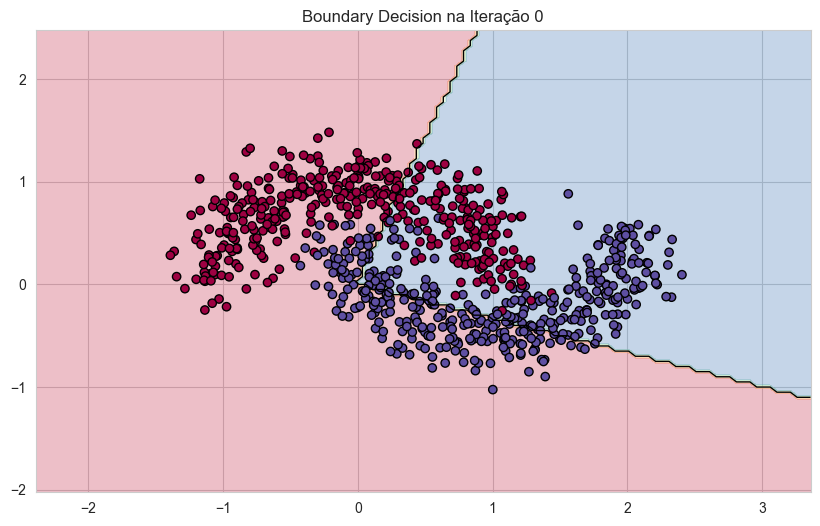

In [78]:
# Criar grid para boundary decision
def create_grid(X, h=0.05):
    x_min, x_max = X[0, :].min() - 1, X[0, :].max() + 1
    y_min, y_max = X[1, :].min() - 1, X[1, :].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
    return xx, yy

# Obter boundary decision para um conjunto de pesos
def get_decision_boundary(W1, b1, W2, b2, W3, b3, W4, b4, W5, b5, XX, YY):
    grid = np.c_[XX.ravel(), YY.ravel()].T  # Transposto para compatibilidade com forward_prop
    _, _, _, _, _, _, _, _, _, A5 = forward_prop(W1, b1, W2, b2, W3, b3, W4, b4, W5, b5, grid)
    preds = get_predictions(A5).reshape(XX.shape)
    return preds

# Criando a figura e os eixos
fig, ax = plt.subplots(figsize=(10, 6))
XX, YY = create_grid(X_train)  # Gerando grid para o espaço de decisão

# Histórico de pesos para animação
history = []

# Função ajustada para armazenar pesos no novo gradient_descent com Adam
def gradient_descent_with_history(X, Y, alpha, iterations):
    W1, b1, W2, b2, W3, b3, W4, b4, W5, b5, m_W1, m_b1, m_W2, m_b2, m_W3, m_b3, m_W4, m_b4, m_W5, m_b5, v_W1, v_b1, v_W2, v_b2, v_W3, v_b3, v_W4, v_b4, v_W5, v_b5 = init_params()
    t = 1
    beta1 = 0.9
    beta2 = 0.999
    epsilon = 10e-8

    for i in range(iterations):
        Z1, A1, Z2, A2, Z3, A3, Z4, A4, Z5, A5 = forward_prop(W1, b1, W2, b2, W3, b3, W4, b4, W5, b5, X)
        dW1, db1, dW2, db2, dW3, db3, dW4, db4, dW5, db5 = backward_prop(Z1, A1, Z2, A2, Z3, A3, Z4, A4, Z5, A5, W1, W2, W3, W4, W5, X, Y)

        # Atualizar parâmetros usando Adam optimizer
        W1, b1, W2, b2, W3, b3, W4, b4, W5, b5, m_W1, m_b1, m_W2, m_b2, m_W3, m_b3, m_W4, m_b4, m_W5, m_b5, v_W1, v_b1, v_W2, v_b2, v_W3, v_b3, v_W4, v_b4, v_W5, v_b5 = update_params(
            W1, b1, W2, b2, W3, b3, W4, b4, W5, b5,
            dW1, db1, dW2, db2, dW3, db3, dW4, db4, dW5, db5,
            alpha, beta1, beta2, epsilon, t,
            m_W1, m_b1, m_W2, m_b2, m_W3, m_b3, m_W4, m_b4, m_W5, m_b5,
            v_W1, v_b1, v_W2, v_b2, v_W3, v_b3, v_W4, v_b4, v_W5, v_b5
        )
        t += 1

        # Salvar pesos para animação
        if i % 5 == 0:  # Guardar a cada 5 iterações para otimizar a animação
            history.append((W1.copy(), b1.copy(), W2.copy(), b2.copy(), W3.copy(), b3.copy(), W4.copy(), b4.copy(), W5.copy(), b5.copy()))

    return W1, b1, W2, b2, W3, b3, W4, b4, W5, b5

# Treinamento e captura do histórico de pesos
W1, b1, W2, b2, W3, b3, W4, b4, W5, b5 = gradient_descent_with_history(X_train, y_train, 0.001, 200)

# Função de atualização da animação
def update(frame):
    ax.clear()
    ax.set_title(f"Boundary Decision na Iteração {frame * 5}")  # Iteração atual

    # Pegando os pesos corretos da memória
    W1, b1, W2, b2, W3, b3, W4, b4, W5, b5 = history[frame]
    
    # Obtendo previsões para a boundary decision
    preds = get_decision_boundary(W1, b1, W2, b2, W3, b3, W4, b4, W5, b5, XX, YY)
    
    # Atualizando gráfico
    ax.contourf(XX, YY, preds, alpha=0.3, cmap=cm.Spectral)
    ax.contour(XX, YY, preds, levels=[0.5], cmap="gray", linewidths=1.)
    
    # Plotando os dados
    ax.scatter(X_train[0, :], X_train[1, :], c=y_train.ravel(), cmap=cm.Spectral, edgecolors='k')
    ax.set_xlim(XX.min(), XX.max())
    ax.set_ylim(YY.min(), YY.max())

    plt.draw()  # Atualizar gráfico

# Criando animação
ani = animation.FuncAnimation(fig, update, frames=len(history), interval=100)
ani.save('gradient_descent_animation.gif', writer='pillow', fps=15)

# Exibindo a animação no Jupyter
HTML(ani.to_jshtml())


In [75]:
# Após o treino, testar no conjunto de teste
Z1, A1, Z2, A2, Z3, A3, Z4, A4, Z5, A5 = forward_prop(W1, b1, W2, b2, W3, b3, W4, b4, W5, b5, X_test.T)
predictions = get_predictions(A5)
accuracy = get_accuracy(predictions, y_test)
print(f"Acurácia no conjunto de teste: {accuracy:.2%}")

Acurácia no conjunto de teste: 97.50%
